In [1]:
## Step 1: Load Configuration and Import Libraries

import json, os

# Load config saved from Notebook 1
with open('/kaggle/input/notebooks/kevinchovatiya/01-kaggle-data-setup/paths_config.json') as f:
    paths = json.load(f)

DATASET_PATH = paths['DATASET_PATH']
OUTPUT_PATH  = paths['OUTPUT_PATH']

print(f"Working with dataset at: {DATASET_PATH}")

Working with dataset at: /kaggle/input/datasets/shubhamgoel27/dermnet


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from collections import Counter

plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

print("✓ Libraries imported successfully!")

✓ Libraries imported successfully!


In [3]:
## Step 2: Create Dataset Statistics DataFrame

def create_dataset_stats(base_path):
    stats = {'train': {}, 'test': {}}

    for split in ['train', 'test']:
        split_path = os.path.join(base_path, split)
        if not os.path.exists(split_path):
            continue

        classes = [d for d in os.listdir(split_path)
                  if os.path.isdir(os.path.join(split_path, d))]

        for class_name in classes:
            class_path = os.path.join(split_path, class_name)
            images = [f for f in os.listdir(class_path)
                     if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
            stats[split][class_name] = {'count': len(images), 'path': class_path}

    train_df = pd.DataFrame([(k, v['count']) for k, v in stats['train'].items()],
                           columns=['Class', 'Train_Count'])
    test_df  = pd.DataFrame([(k, v['count']) for k, v in stats['test'].items()],
                           columns=['Class', 'Test_Count'])

    df = train_df.merge(test_df, on='Class', how='outer').fillna(0)
    df['Total'] = df['Train_Count'] + df['Test_Count']
    df = df.sort_values('Total', ascending=False)
    return df, stats

df_stats, dataset_stats = create_dataset_stats(DATASET_PATH)

print("\n📊 Dataset Statistics:\n")
print(df_stats)
print(f"\nTotal Classes: {len(df_stats)}")
print(f"Total Training Images: {df_stats['Train_Count'].sum():.0f}")
print(f"Total Testing Images:  {df_stats['Test_Count'].sum():.0f}")
print(f"Total Images: {df_stats['Total'].sum():.0f}")


📊 Dataset Statistics:

                                                Class  Train_Count  \
14  Psoriasis pictures Lichen Planus and related d...         1405   
16       Seborrheic Keratoses and other Benign Tumors         1371   
18  Tinea Ringworm Candidiasis and other Fungal In...         1300   
5                                       Eczema Photos         1235   
1   Actinic Keratosis Basal Cell Carcinoma and oth...         1149   
22         Warts Molluscum and other Viral Infections         1086   
12                 Nail Fungus and other Nail Disease         1040   
0                             Acne and Rosacea Photos          840   
17                                   Systemic Disease          606   
9        Light Diseases and Disorders of Pigmentation          568   
2                            Atopic Dermatitis Photos          489   
20                                    Vascular Tumors          482   
11                Melanoma Skin Cancer Nevi and Moles          463

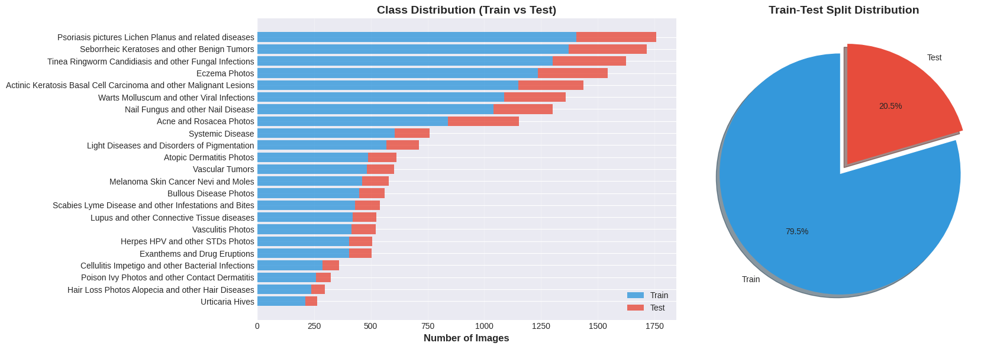

✓ Saved: /kaggle/working/class_distribution.png


In [4]:
## Step 3: Visualize Class Distribution

def plot_class_distribution(df_stats):
    fig, axes = plt.subplots(1, 2, figsize=(18, 6))

    df_plot = df_stats.sort_values('Total', ascending=True)
    axes[0].barh(df_plot['Class'], df_plot['Train_Count'], label='Train', alpha=0.8, color='#3498db')
    axes[0].barh(df_plot['Class'], df_plot['Test_Count'],
                 left=df_plot['Train_Count'], label='Test', alpha=0.8, color='#e74c3c')
    axes[0].set_xlabel('Number of Images', fontsize=12, fontweight='bold')
    axes[0].set_title('Class Distribution (Train vs Test)', fontsize=14, fontweight='bold')
    axes[0].legend()
    axes[0].grid(axis='x', alpha=0.3)

    total_train = df_stats['Train_Count'].sum()
    total_test  = df_stats['Test_Count'].sum()
    axes[1].pie([total_train, total_test], labels=['Train', 'Test'],
                autopct='%1.1f%%', colors=['#3498db', '#e74c3c'],
                explode=(0.05, 0.05), shadow=True, startangle=90)
    axes[1].set_title('Train-Test Split Distribution', fontsize=14, fontweight='bold')

    plt.tight_layout()
    save_path = os.path.join(OUTPUT_PATH, 'class_distribution.png')
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"✓ Saved: {save_path}")

plot_class_distribution(df_stats)

In [5]:
## Step 4: Analyze Image Properties

def analyze_image_properties(stats, sample_size=100):
    print("Analyzing image properties...\n")
    dimensions, file_sizes, channels = [], [], []

    for split in ['train', 'test']:
        for class_name, info in stats[split].items():
            class_path = info['path']
            images = [f for f in os.listdir(class_path)
                     if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
            sample = images[:min(sample_size, len(images))]

            for img_name in sample:
                img_path = os.path.join(class_path, img_name)
                try:
                    img = Image.open(img_path)
                    dimensions.append(img.size)
                    channels.append(len(img.getbands()))
                    file_sizes.append(os.path.getsize(img_path) / 1024)
                except Exception as e:
                    print(f"Error: {e}")

    widths  = [d[0] for d in dimensions]
    heights = [d[1] for d in dimensions]

    print(f"📐 Dimensions — W: {min(widths)}-{max(widths)}px avg {np.mean(widths):.1f}  |  H: {min(heights)}-{max(heights)}px avg {np.mean(heights):.1f}")
    print(f"💾 File Size  — Min: {min(file_sizes):.1f}KB, Max: {max(file_sizes):.1f}KB, Avg: {np.mean(file_sizes):.1f}KB")
    print(f"🎨 Channels   — {Counter(channels)}")
    return dimensions, file_sizes, channels

dimensions, file_sizes, channels = analyze_image_properties(dataset_stats, sample_size=100)

Analyzing image properties...

📐 Dimensions — W: 326-720px avg 656.9  |  H: 385-768px avg 547.2
💾 File Size  — Min: 26.5KB, Max: 451.9KB, Avg: 92.6KB
🎨 Channels   — Counter({3: 4451})


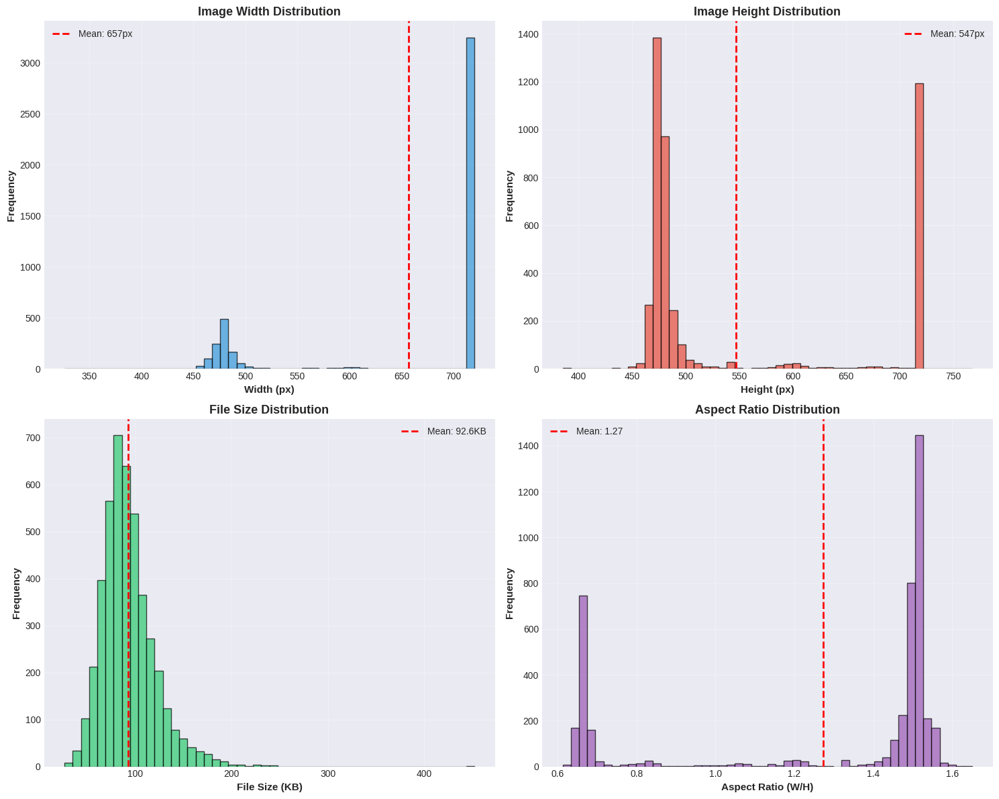

✓ Saved: /kaggle/working/image_properties.png


In [6]:
## Step 5: Visualize Image Properties

def plot_image_properties(dimensions, file_sizes):
    widths  = [d[0] for d in dimensions]
    heights = [d[1] for d in dimensions]
    aspect_ratios = [w/h for w, h in dimensions]

    fig, axes = plt.subplots(2, 2, figsize=(15, 12))

    for ax, data, color, xlabel, title, mean_label in [
        (axes[0,0], widths,        '#3498db', 'Width (px)',          'Image Width Distribution',    f'Mean: {np.mean(widths):.0f}px'),
        (axes[0,1], heights,       '#e74c3c', 'Height (px)',         'Image Height Distribution',   f'Mean: {np.mean(heights):.0f}px'),
        (axes[1,0], file_sizes,    '#2ecc71', 'File Size (KB)',      'File Size Distribution',      f'Mean: {np.mean(file_sizes):.1f}KB'),
        (axes[1,1], aspect_ratios, '#9b59b6', 'Aspect Ratio (W/H)', 'Aspect Ratio Distribution',   f'Mean: {np.mean(aspect_ratios):.2f}'),
    ]:
        ax.hist(data, bins=50, color=color, alpha=0.7, edgecolor='black')
        ax.axvline(np.mean(data), color='red', linestyle='--', linewidth=2, label=mean_label)
        ax.set_xlabel(xlabel, fontsize=11, fontweight='bold')
        ax.set_ylabel('Frequency', fontsize=11, fontweight='bold')
        ax.set_title(title, fontsize=13, fontweight='bold')
        ax.legend()
        ax.grid(alpha=0.3)

    plt.tight_layout()
    save_path = os.path.join(OUTPUT_PATH, 'image_properties.png')
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"✓ Saved: {save_path}")

plot_image_properties(dimensions, file_sizes)

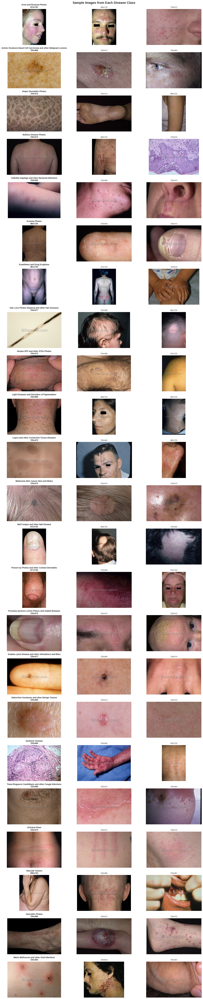

✓ Saved: /kaggle/working/sample_images.png


In [7]:
## Step 6: Display Sample Images from Each Class

def display_sample_images(stats, samples_per_class=3):
    classes = list(stats['train'].keys())
    num_classes = len(classes)

    fig, axes = plt.subplots(num_classes, samples_per_class,
                            figsize=(15, num_classes * 3))
    if num_classes == 1:
        axes = axes.reshape(1, -1)

    for i, class_name in enumerate(sorted(classes)):
        class_path = stats['train'][class_name]['path']
        images = [f for f in os.listdir(class_path)
                 if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        samples = np.random.choice(images, min(samples_per_class, len(images)), replace=False)

        for j, img_name in enumerate(samples):
            img = Image.open(os.path.join(class_path, img_name))
            axes[i, j].imshow(img)
            axes[i, j].axis('off')
            if j == 0:
                axes[i, j].set_title(f"{class_name}\n{img.size[0]}x{img.size[1]}", fontsize=10, fontweight='bold')
            else:
                axes[i, j].set_title(f"{img.size[0]}x{img.size[1]}", fontsize=9)

    plt.suptitle('Sample Images from Each Disease Class', fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    save_path = os.path.join(OUTPUT_PATH, 'sample_images.png')
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"✓ Saved: {save_path}")

display_sample_images(dataset_stats, samples_per_class=3)

In [8]:

## Summary

##✅ Class distribution visualized  
##✅ Image properties analyzed  
##✅ Sample images displayed  
##All plots saved to `/kaggle/working/`